# Image segmentation with a U-Net-like architecture

**Author:** [fchollet](https://twitter.com/fchollet)<br>
**Date created:** 2019/03/20<br>
**Last modified:** 2020/04/20<br>
**Description:** Image segmentation model trained from scratch on the Oxford Pets dataset.

## Download the data

In [ ]:
!curl -O https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!curl -O https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xf images.tar.gz
!tar -xf annotations.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  755M  100  755M    0     0  28.0M      0  0:00:26  0:00:26 --:--:-- 29.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.2M  100 18.2M    0     0  10.9M      0  0:00:01  0:00:01 --:--:-- 10.9M


## Prepare paths of input images and target segmentation masks

In [ ]:
import os

input_dir = "images/"
target_dir = "annotations/trimaps/"
img_size = (160, 160)
num_classes = 3
batch_size = 32

input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith(".jpg")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        if fname.endswith(".png") and not fname.startswith(".")
    ]
)

print("Number of samples:", len(input_img_paths))

for input_path, target_path in zip(input_img_paths[:10], target_img_paths[:10]):
    print(input_path, "|", target_path)

Number of samples: 7390
images/Abyssinian_1.jpg | annotations/trimaps/Abyssinian_1.png
images/Abyssinian_10.jpg | annotations/trimaps/Abyssinian_10.png
images/Abyssinian_100.jpg | annotations/trimaps/Abyssinian_100.png
images/Abyssinian_101.jpg | annotations/trimaps/Abyssinian_101.png
images/Abyssinian_102.jpg | annotations/trimaps/Abyssinian_102.png
images/Abyssinian_103.jpg | annotations/trimaps/Abyssinian_103.png
images/Abyssinian_104.jpg | annotations/trimaps/Abyssinian_104.png
images/Abyssinian_105.jpg | annotations/trimaps/Abyssinian_105.png
images/Abyssinian_106.jpg | annotations/trimaps/Abyssinian_106.png
images/Abyssinian_107.jpg | annotations/trimaps/Abyssinian_107.png


images/Abyssinian_101.jpg annotations/trimaps/Abyssinian_101.png


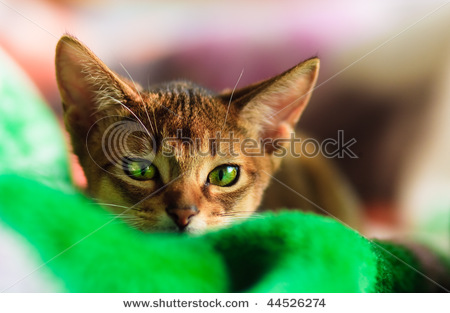

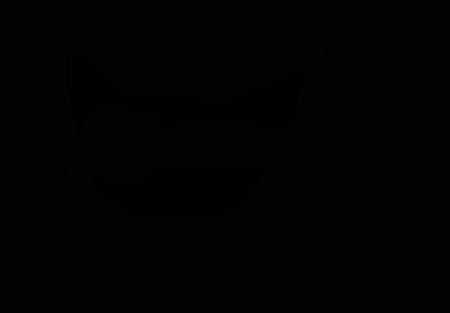

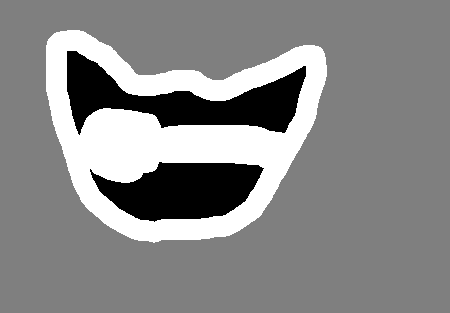

In [ ]:
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
import PIL
from PIL import ImageOps

s = 3
print(input_img_paths[s] + " " + target_img_paths[s])
display(Image(filename=input_img_paths[s]))
display(Image(filename=target_img_paths[s]))

img = PIL.ImageOps.autocontrast(load_img(target_img_paths[s]))
display(img)

## What does one input image and corresponding segmentation mask look like?

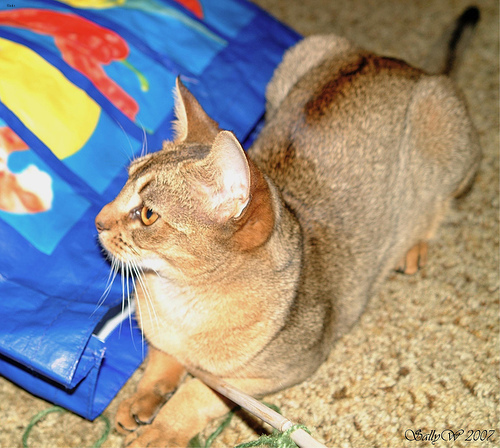

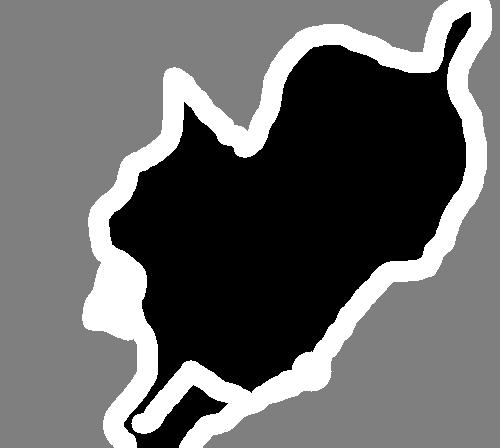

In [ ]:
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
import PIL
from PIL import ImageOps

# Display input image #7
display(Image(filename=input_img_paths[9]))

# Display auto-contrast version of corresponding target (per-pixel categories)
img = PIL.ImageOps.autocontrast(load_img(target_img_paths[9]))
display(img)

## Prepare `Sequence` class to load & vectorize batches of data

In [ ]:
from tensorflow import keras
import numpy as np
from tensorflow.keras.preprocessing.image import load_img


class OxfordPets(keras.utils.Sequence):
    """Helper to iterate over the data (as Numpy arrays)."""

    def __init__(self, batch_size, img_size, input_img_paths, target_img_paths):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths) // self.batch_size

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size=self.img_size)
            x[j] = img
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_target_img_paths):
            img = load_img(path, target_size=self.img_size, color_mode="grayscale")
            y[j] = np.expand_dims(img, 2)
            # Ground truth labels are 1, 2, 3. Subtract one to make them 0, 1, 2:
            y[j] -= 1
        return x, y


## Prepare U-Net Xception-style model

In [ ]:
from tensorflow.keras import layers


def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model


# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model(img_size, num_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 80, 80, 32)   896         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 80, 80, 32)  128         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

## Set aside a validation split

In [ ]:
import random

# Split our img paths into a training and a validation set
val_samples = 1000
random.Random(1337).shuffle(input_img_paths)
random.Random(1337).shuffle(target_img_paths)
train_input_img_paths = input_img_paths[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]
val_input_img_paths = input_img_paths[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]

# Instantiate data Sequences for each split
train_gen = OxfordPets(
    batch_size, img_size, train_input_img_paths, train_target_img_paths
)
val_gen = OxfordPets(batch_size, img_size, val_input_img_paths, val_target_img_paths)

## Train the model

In [ ]:
# Configure the model for training.
# We use the "sparse" version of categorical_crossentropy
# because our target data is integers.
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation.h5", save_best_only=True)
]

# Train the model, doing validation at the end of each epoch.
epochs = 15
model.fit(train_gen, epochs=epochs, validation_data=val_gen, callbacks=callbacks)

Epoch 1/15
199/199 [==============================] - 69s 261ms/step - loss: 1.1309 - val_loss: 2.3960
Epoch 2/15
199/199 [==============================] - 52s 259ms/step - loss: 0.5182 - val_loss: 2.9850
Epoch 3/15
199/199 [==============================] - 52s 262ms/step - loss: 0.4348 - val_loss: 0.4750
Epoch 4/15
199/199 [==============================] - 52s 258ms/step - loss: 0.3869 - val_loss: 0.4815
Epoch 5/15
199/199 [==============================] - 52s 259ms/step - loss: 0.3529 - val_loss: 0.3711
Epoch 6/15
199/199 [==============================] - 51s 258ms/step - loss: 0.3230 - val_loss: 0.3855
Epoch 7/15
199/199 [==============================] - 51s 257ms/step - loss: 0.2995 - val_loss: 0.4019
Epoch 8/15
199/199 [==============================] - 51s 258ms/step - loss: 0.2762 - val_loss: 0.3641
Epoch 9/15
199/199 [==============================] - 52s 261ms/step - loss: 0.2572 - val_loss: 0.4288
Epoch 10/15
199/199 [==============================] - 51s 257ms/step - l

## Visualize predictions

In [ ]:
from google.colab import files
uploaded = files.upload() # 파일 업로드 기능 실행

from google.colab import files
uploaded = files.upload() # 파일 업로드 기능 실행
    
for fn in uploaded.keys(): # 업로드된 파일 정보 출력
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))

Saving image1.png to image1.png


Saving image2.png to image2.png
User uploaded file "image2.png" with length 2672042 bytes


In [ ]:
#img = PIL.Image.open("./i1.jpg").convert("RGB")
#new_img = img.resize((160,160), PIL.Image.ANTIALIAS) 
#new_img.save("./i1.jpg", format='jpeg', quality=100)

#img = PIL.Image.open("./i2.png").convert("RGB")
#new_img = img.resize((160,160), PIL.Image.ANTIALIAS) 
#new_img.save("./i2.png", format='png', quality=100)

In [ ]:
val_input_img_paths.append('image2.png')
val_target_img_paths.append('image2.png')

val_input_img_paths.append('image1.png')
val_target_img_paths.append('image1.png')

val_gen = OxfordPets(batch_size, img_size, val_input_img_paths, val_target_img_paths)
val_preds = model.predict(val_gen)

In [ ]:
del val_input_img_paths[-1]
del val_target_img_paths[-1]

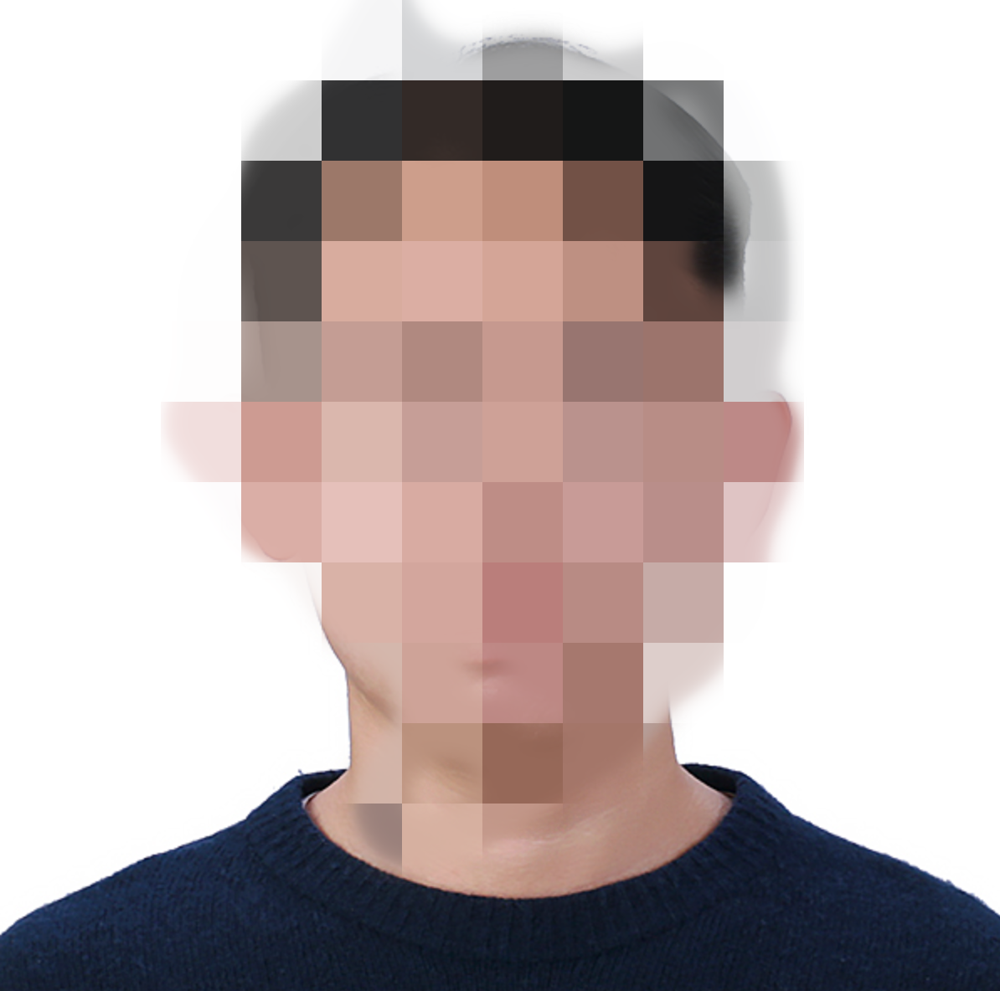

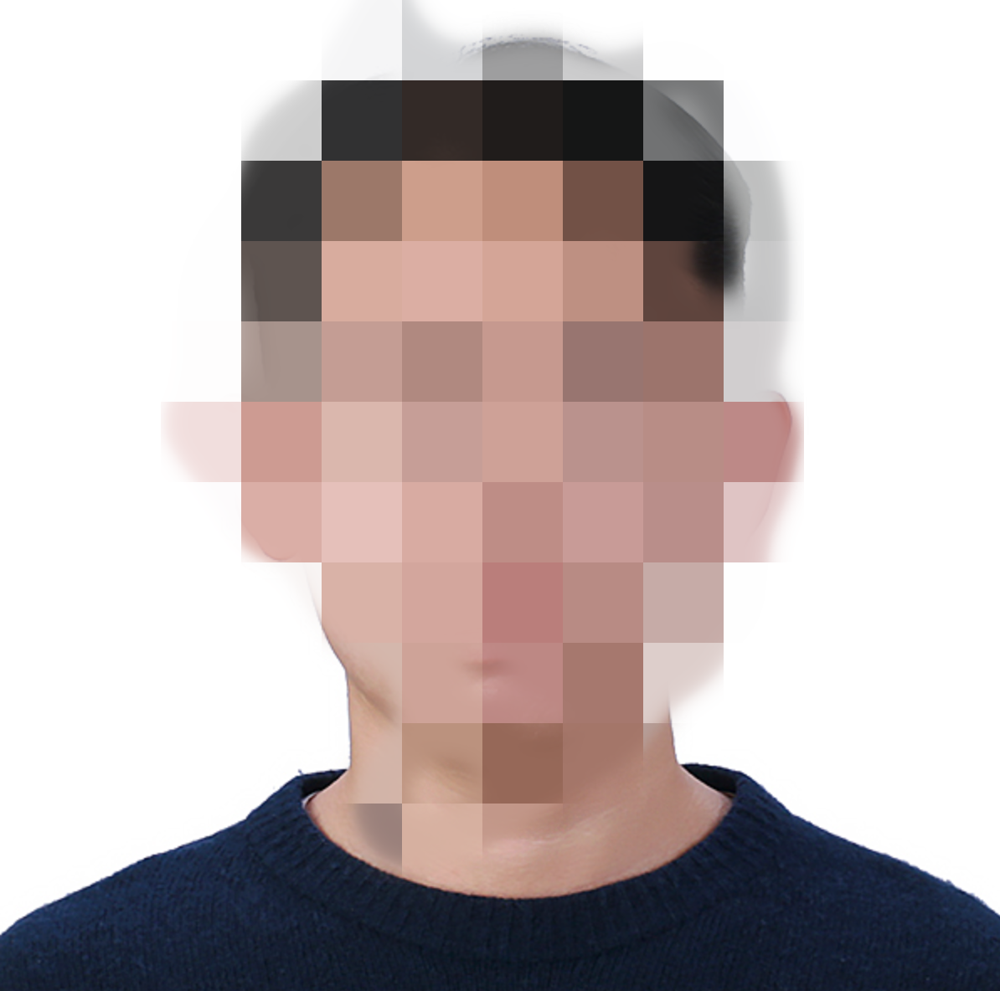

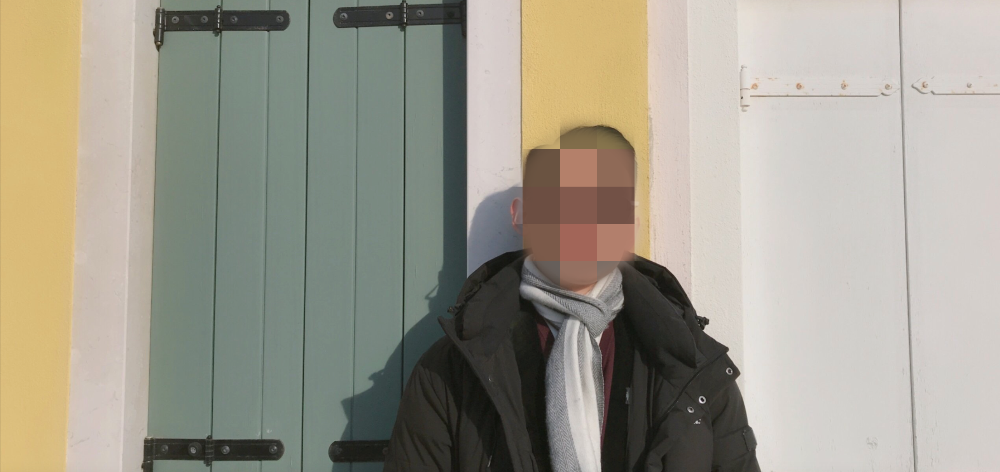

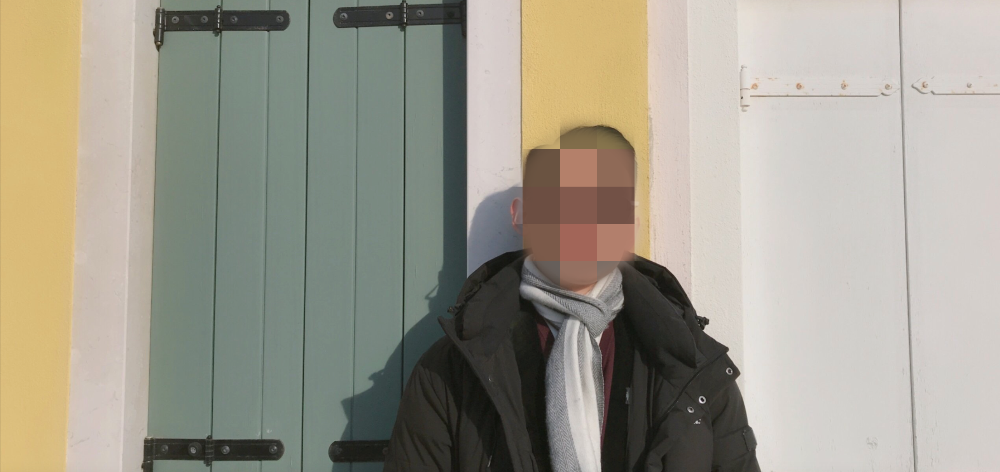

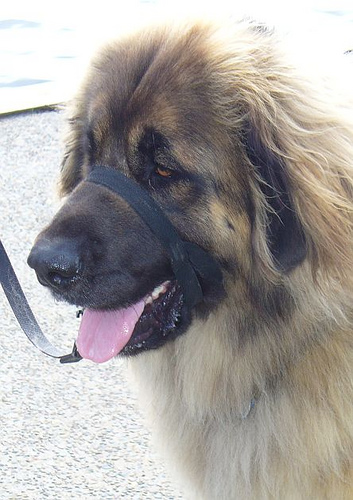

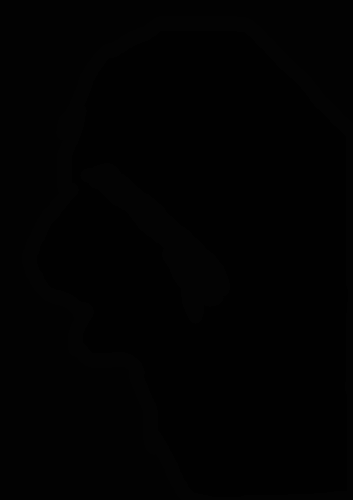

In [ ]:
i=-1
display(Image(val_input_img_paths[i]))
display(Image(val_target_img_paths[i]))
i=-2
display(Image(val_input_img_paths[i]))
display(Image(val_target_img_paths[i]))
i=-3
display(Image(val_input_img_paths[i]))
display(Image(val_target_img_paths[i]))



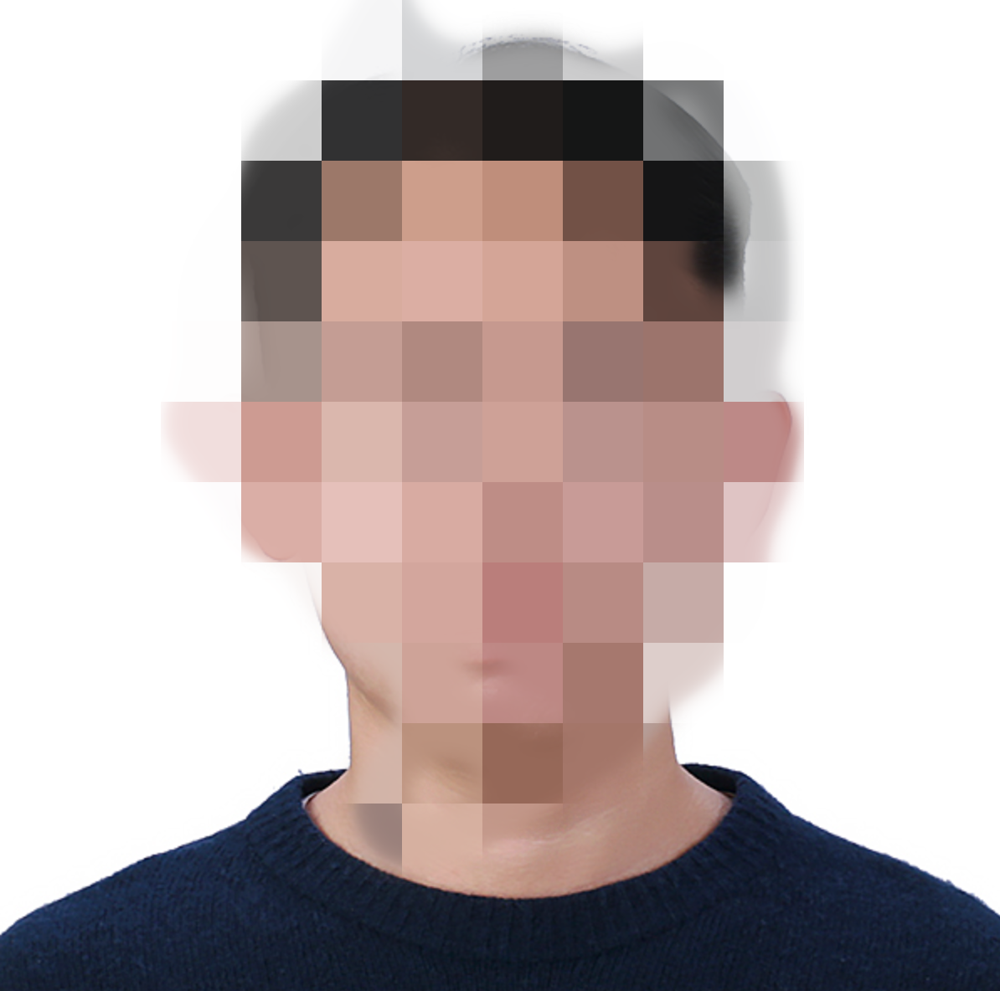

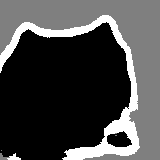

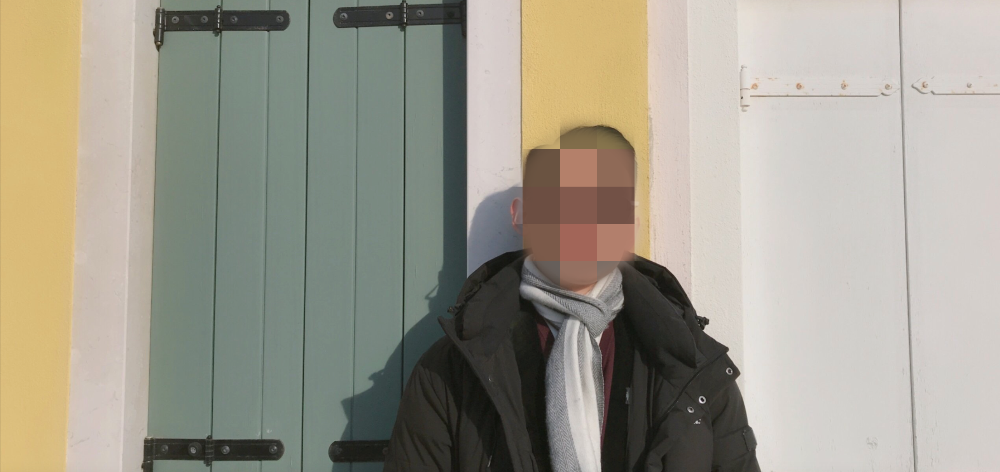

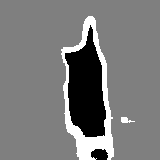

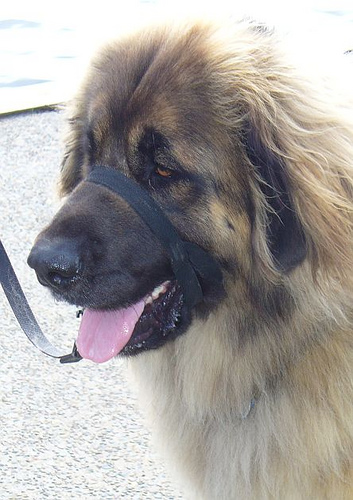

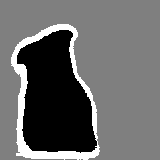

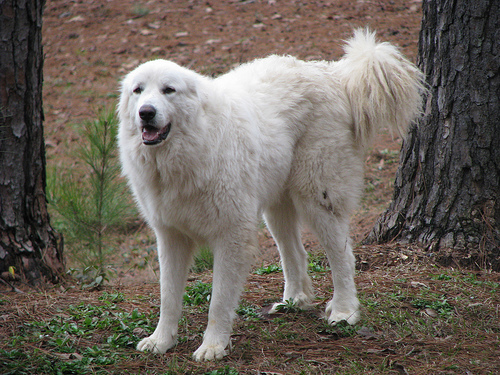

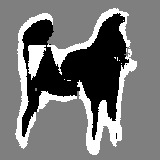

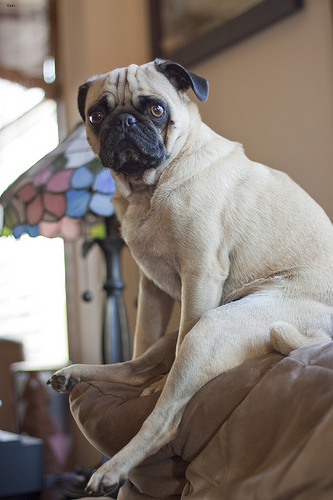

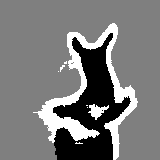

In [ ]:
# Generate predictions for all images in the validation set

def display_mask(i):
    """Quick utility to display a model's prediction."""
    mask = np.argmax(val_preds[i], axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    img = PIL.ImageOps.autocontrast(keras.preprocessing.image.array_to_img(mask))
    display(img)


# Display results for validation image #-2
i = -1

# Display input image
display(Image(val_input_img_paths[i]))

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.

# Display results for validation image #-1
i = -2

# Display input image
display(Image(filename=val_input_img_paths[i]))

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.

# Display results for validation image #-1
i = -3

# Display input image
display(Image(filename=val_input_img_paths[i]))

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.

# Display results for validation image #-1
i = -4

# Display input image
display(Image(filename=val_input_img_paths[i]))

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.

# Display results for validation image #-1
i = -5

# Display input image
display(Image(filename=val_input_img_paths[i]))

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.